In [1]:
import os
os.chdir(os.path.dirname(os.getcwd()))

In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

In [61]:
# read scenarios from csv file
scenarios = pd.read_csv('data/scenarios.csv', parse_dates=['timestamp'], index_col=[0])
scenarios = scenarios.set_index('timestamp', drop=True)
fors = pd.read_csv('data/quantile/year_qs_test.csv', parse_dates=['timestamp'], index_col=[0])
scenarios


,scan_1,scan_2,scan_3,scan_4,scan_5,scan_6,scan_7,scan_8,scan_9,scan_10,real
timestamp,,,,,,,,,,,
2021-08-02 00:00:00,0.411828,0.380796,0.390080,0.412646,0.420013,0.314510,0.329770,0.423716,0.443345,0.437805,0.409185
2021-08-02 01:00:00,0.422650,0.408795,0.320583,0.397852,0.398206,0.409882,0.384279,0.424439,0.413970,0.430492,0.409185
2021-08-02 02:00:00,0.432202,0.397773,0.378427,0.380880,0.398154,0.376202,0.404695,0.407191,0.455358,0.422795,0.409185
2021-08-02 03:00:00,0.468394,0.427618,0.420816,0.364732,0.386851,0.389232,0.380741,0.374563,0.468761,0.390257,0.409185
2021-08-02 04:00:00,0.440128,0.491723,0.522193,0.401216,0.378524,0.455751,0.389464,0.363144,0.744780,0.392101,0.405682
...,...,...,...,...,...,...,...,...,...,...,...
2022-07-30 19:00:00,0.564532,0.499798,0.550448,0.431214,0.493109,0.466123,0.391685,0.825404,0.394047,0.685473,0.533175
2022-07-30 20:00:00,0.641312,0.599204,0.510239,0.334666,0.505377,0.601729,0.327375,0.684533,0.417100,0.629697,0.503666
2022-07-30 21:00:00,0.678585,0.585098,0.448405,0.529385,0.666772,0.586511,0.376032,0.575779,0.420541,0.434171,0.499451


<AxesSubplot:xlabel='timestamp'>

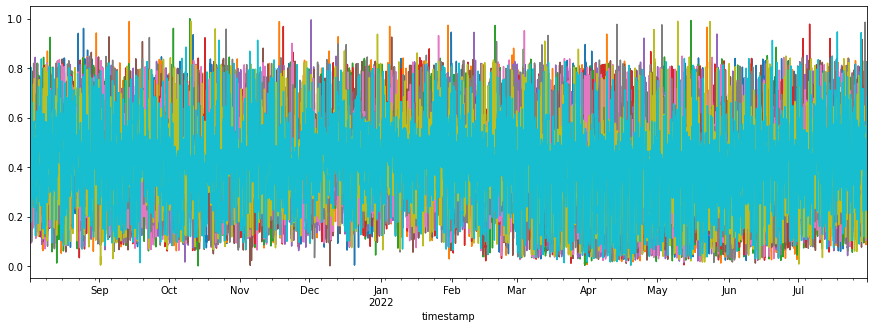

In [63]:
scenarios.iloc[:, :-1].plot(figsize=(15, 5), legend=False)

In [71]:
# plot the scenarios in plotly
fig = px.line(scenarios.iloc[:, :-1], title='Scenarios')
# fill prediciton intervals from 0.1 and 0.9 quantiles with black linecolor
trace1 = go.Scatter(x=fors.index, y=fors['0.1'], line_color='black')
trace2 = go.Scatter(x=fors.index, y=fors['0.9'], line_color='black', fill='tonexty')

data = [trace1, trace2]
#layout = go.Layout(yaxis=dict(range=[0, 10]))
fig.add_traces(data)
fig.show()

In [72]:
# read scenarios from csv file
scenarios_corr = pd.read_csv('data/scenarios.csv', parse_dates=['timestamp'], index_col=[0])
scenarios_corr = scenarios_corr.set_index('timestamp', drop=True)
scenarios_corr


,scan_1,scan_2,scan_3,scan_4,scan_5,scan_6,scan_7,scan_8,scan_9,scan_10,real
timestamp,,,,,,,,,,,
2021-08-02 00:00:00,0.411828,0.380796,0.390080,0.412646,0.420013,0.314510,0.329770,0.423716,0.443345,0.437805,0.409185
2021-08-02 01:00:00,0.422650,0.408795,0.320583,0.397852,0.398206,0.409882,0.384279,0.424439,0.413970,0.430492,0.409185
2021-08-02 02:00:00,0.432202,0.397773,0.378427,0.380880,0.398154,0.376202,0.404695,0.407191,0.455358,0.422795,0.409185
2021-08-02 03:00:00,0.468394,0.427618,0.420816,0.364732,0.386851,0.389232,0.380741,0.374563,0.468761,0.390257,0.409185
2021-08-02 04:00:00,0.440128,0.491723,0.522193,0.401216,0.378524,0.455751,0.389464,0.363144,0.744780,0.392101,0.405682
...,...,...,...,...,...,...,...,...,...,...,...
2022-07-30 19:00:00,0.564532,0.499798,0.550448,0.431214,0.493109,0.466123,0.391685,0.825404,0.394047,0.685473,0.533175
2022-07-30 20:00:00,0.641312,0.599204,0.510239,0.334666,0.505377,0.601729,0.327375,0.684533,0.417100,0.629697,0.503666
2022-07-30 21:00:00,0.678585,0.585098,0.448405,0.529385,0.666772,0.586511,0.376032,0.575779,0.420541,0.434171,0.499451


In [73]:
# plot the scenarios in plotly
fig = px.line(scenarios_corr.iloc[:, :-1], title='Scenarios')
trace1 = go.Scatter(x=fors.index, y=fors['0.1'], line_color='black')
trace2 = go.Scatter(x=fors.index, y=fors['0.9'], line_color='black', fill='tonexty')

data = [trace1, trace2]
#layout = go.Layout(yaxis=dict(range=[0, 10]))
fig.add_traces(data)
fig.show()